In [1]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

/home/akansh-i2sc/anaconda3/envs/hiwi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_24920/2778500982.py:11: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [2]:
PLACE_NAME = 'Saarbrücken, Saarland, Germany'
name = 'Saarbrücken'
grid_size = 500

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


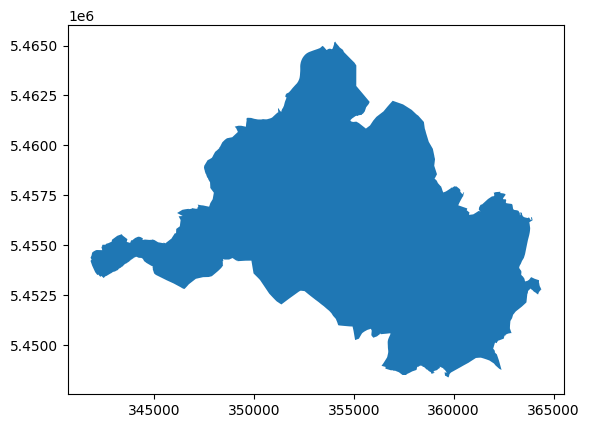

In [3]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [4]:
#save geometry
city.to_file(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}.shp")

#### Division into grid

In [5]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


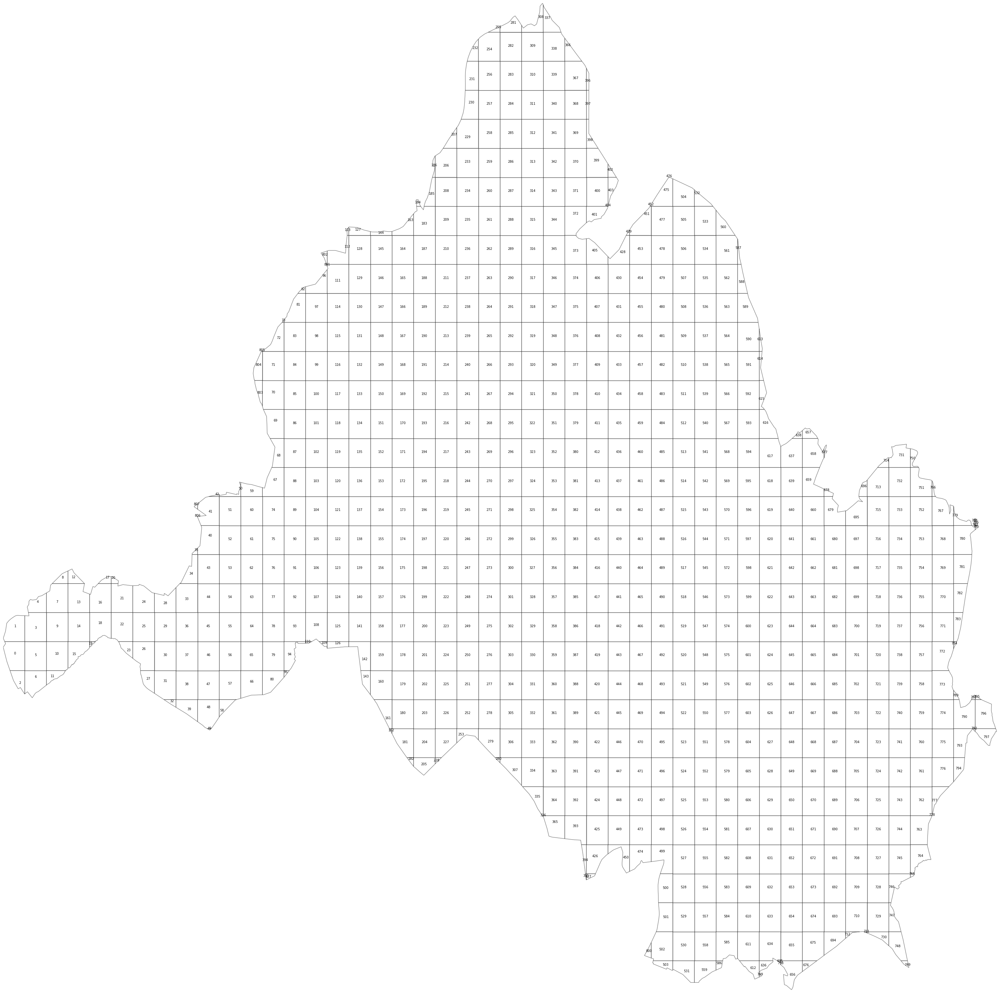

In [6]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [7]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((341818.173 5454221.018, 341872.307 5..."
1,"POLYGON ((341852.521 5454316.628, 341819.983 5..."
2,"POLYGON ((342308.971 5453821.962, 342308.971 5..."
3,"POLYGON ((342308.971 5454757.830, 342404.671 5..."
4,"POLYGON ((342390.884 5454811.293, 342375.424 5..."


(6304129.474131667, 6329687.270636098)

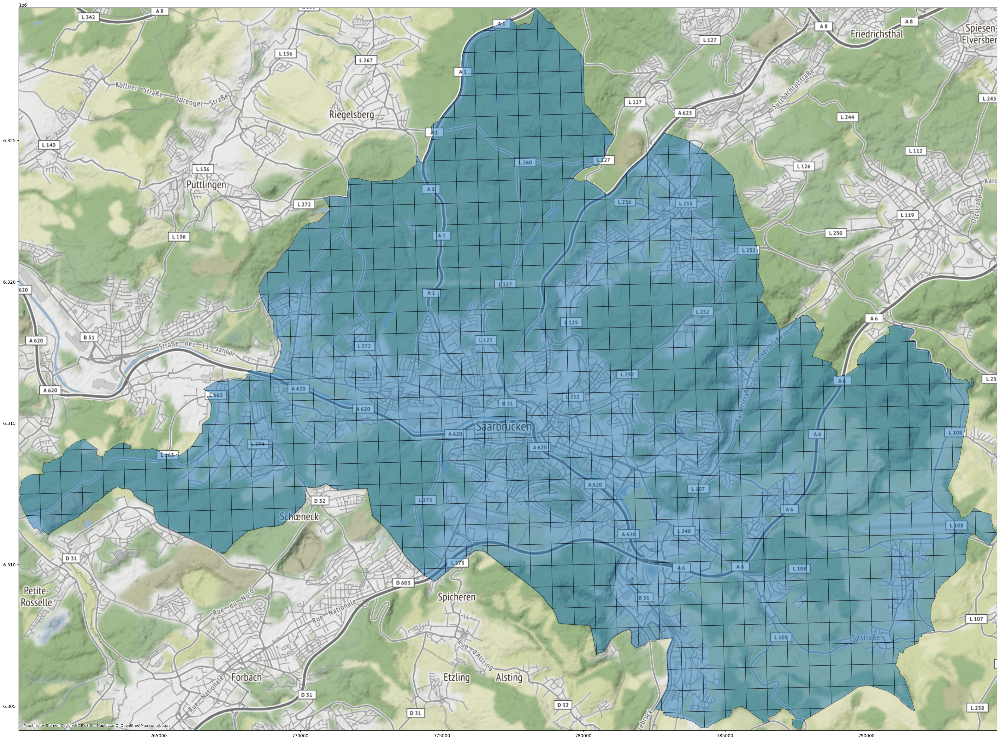

In [8]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [9]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((6.82767 49.22033, 6.82839 49.22090, ..."
1,"POLYGON ((6.82811 49.22120, 6.82764 49.22171, ..."
2,"POLYGON ((6.83457 49.21687, 6.83472 49.21331, ..."
3,"POLYGON ((6.83420 49.22529, 6.83551 49.22528, ..."
4,"POLYGON ((6.83530 49.22579, 6.83506 49.22635, ..."


##### 1. EV stations

In [10]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

Text(0.5, 1.0, 'Saarbrücken, Saarland, Germany EV stations')

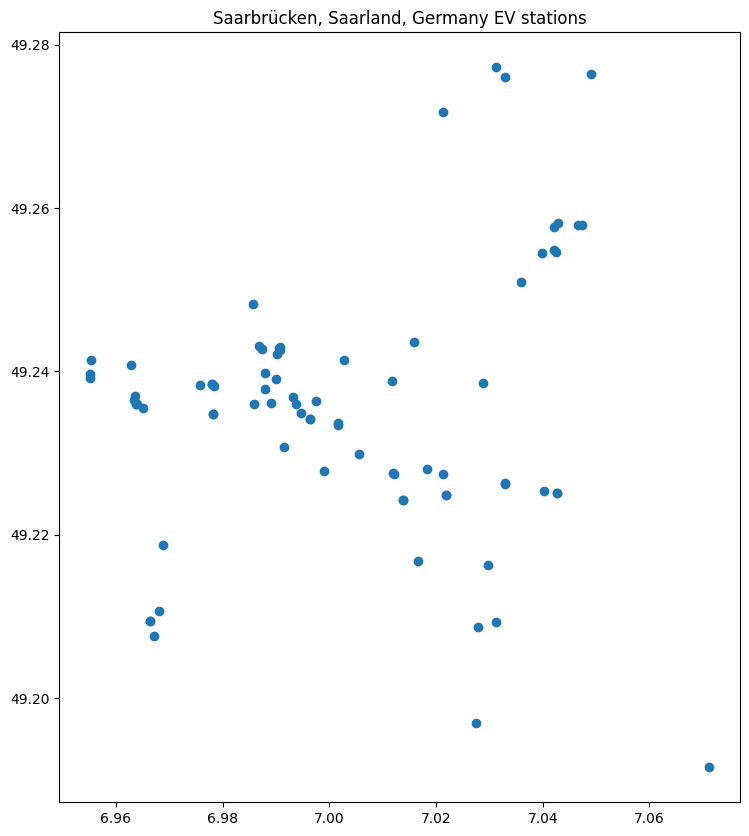

In [11]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title(f"{PLACE_NAME} EV stations")

Text(0.5, 1.0, 'Saarbrücken, Saarland, Germany EV stations')

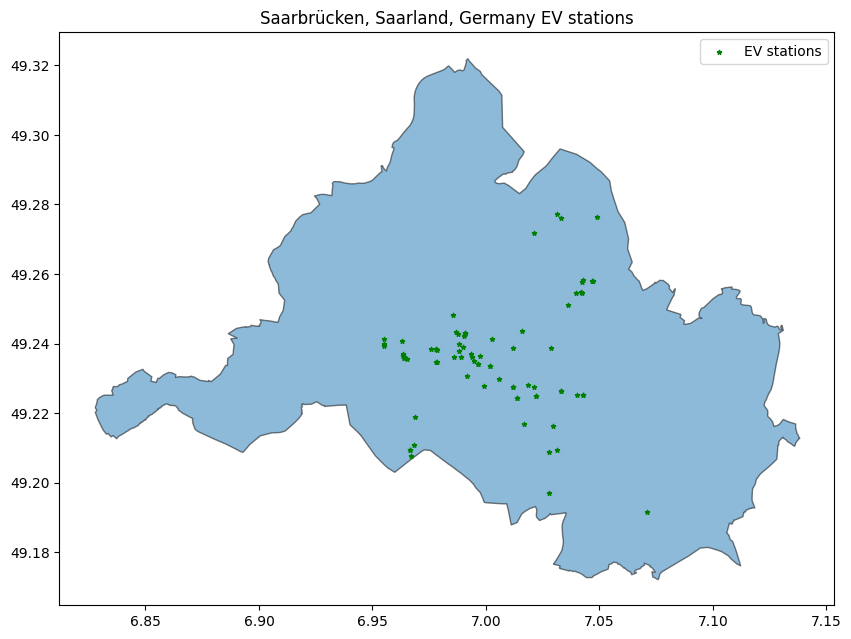

In [12]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title(f"{PLACE_NAME} EV stations")

In [13]:
list(EV_stations.columns)

['amenity',
 'authentication:debit_card',
 'authentication:membership_card',
 'authentication:money_card',
 'capacity',
 'fee',
 'motorcar',
 'opening_hours',
 'operator',
 'ref',
 'geometry',
 'website',
 'amperage',
 'contact:website',
 'manufacturer',
 'socket:schuko',
 'socket:type2',
 'fixme',
 'operator:wikidata',
 'name',
 'authentication:pin',
 'bicycle',
 'charging_station:type',
 'description',
 'maxstay',
 'payment:coins',
 'scooter',
 'truck',
 'check_date:opening_hours',
 'lit',
 'noname',
 'noref',
 'authentication:nfc',
 'socket:type2_combo',
 'authentication:app',
 'voltage',
 'covered',
 'operator:wikipedia',
 'parking:fee',
 'socket:chademo',
 'socket:chademo:output',
 'socket:type2:output',
 'socket:type2_combo:output',
 'charge',
 'authentication:short_message',
 'motor_vehicle',
 'access',
 'note',
 'strapline',
 'supervised',
 'support',
 'man_made',
 'brand',
 'start_date']

In [14]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          2967597755    POINT (7.02125 49.22742)
              3481556531    POINT (7.02968 49.21638)
              3481556532    POINT (7.00162 49.23347)
              3481556533    POINT (6.97822 49.23479)
              3481556534    POINT (6.95522 49.23918)
Name: geometry, dtype: geometry

In [15]:
#check null values out of toital values
print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
#output column
# print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
#parking column
# print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
#charging_station:output column

0.9367088607594937
0.9873417721518988
0.3670886075949367
0.9367088607594937


In [16]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_24920/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 808/808 [00:00<00:00, 45578.61it/s]


In [17]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
# EV_stations[masks_EV[1438]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [18]:
#EV stations in the 3022 grid (example)
# EV_stations[masks_EV[3022]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [19]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 808/808 [00:01<00:00, 558.91it/s]


In [20]:
# EV_stations[masks_EV[1438]]['amperage'].values.tolist()

In [21]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
# berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
# berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
# berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [22]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

  0%|          | 0/808 [00:00<?, ?it/s]

100%|██████████| 808/808 [00:01<00:00, 572.08it/s]


In [23]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0.0    0.948020
1.0    0.028465
2.0    0.012376
4.0    0.006188
5.0    0.002475
3.0    0.002475
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [24]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

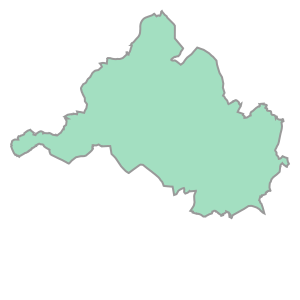

In [47]:
#extract population data for berlin
city.geometry[0]

In [48]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [49]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

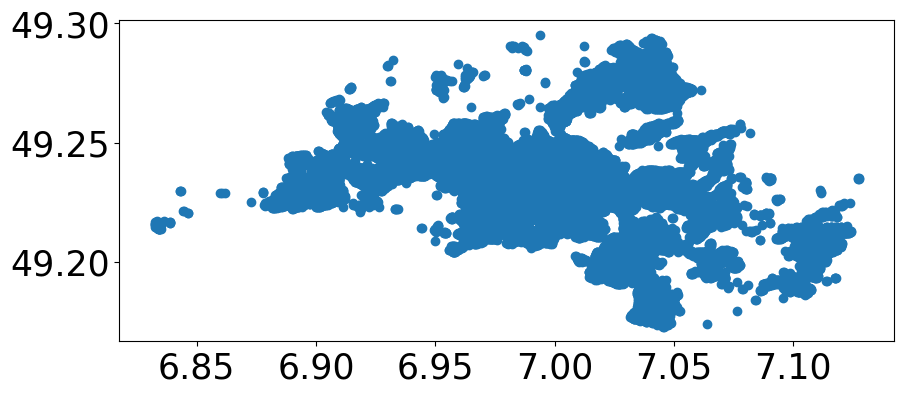

In [50]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [51]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [52]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 808/808 [00:00<00:00, 1380.01it/s]


In [53]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [54]:
pop_grid = np.nan_to_num(pop_grid)

In [55]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse
0,"POLYGON ((6.82767 49.22033, 6.82839 49.22090, ...",0.0,[],4.013377,Other
1,"POLYGON ((6.82811 49.22120, 6.82764 49.22171, ...",0.0,[],0.000000,Other
2,"POLYGON ((6.83457 49.21687, 6.83472 49.21331, ...",0.0,[],4.013377,Other
3,"POLYGON ((6.83420 49.22529, 6.83551 49.22528, ...",0.0,[],0.000000,Other
4,"POLYGON ((6.83530 49.22579, 6.83506 49.22635, ...",0.0,[],0.000000,Other


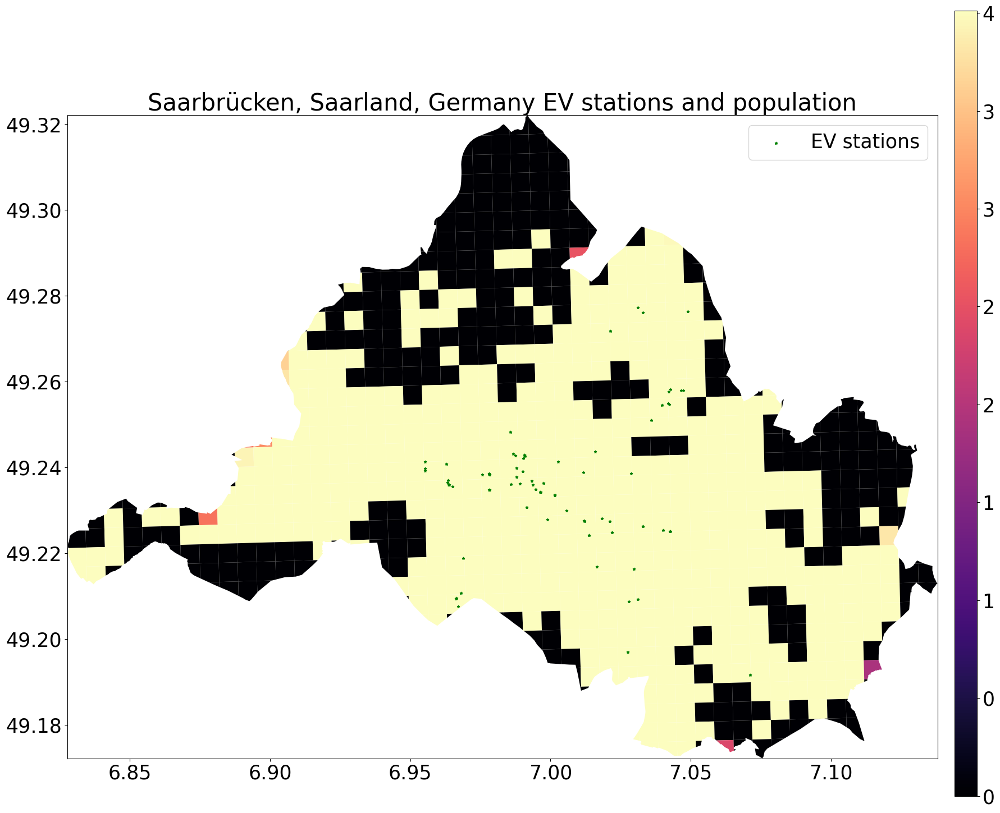

In [56]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [57]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [58]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

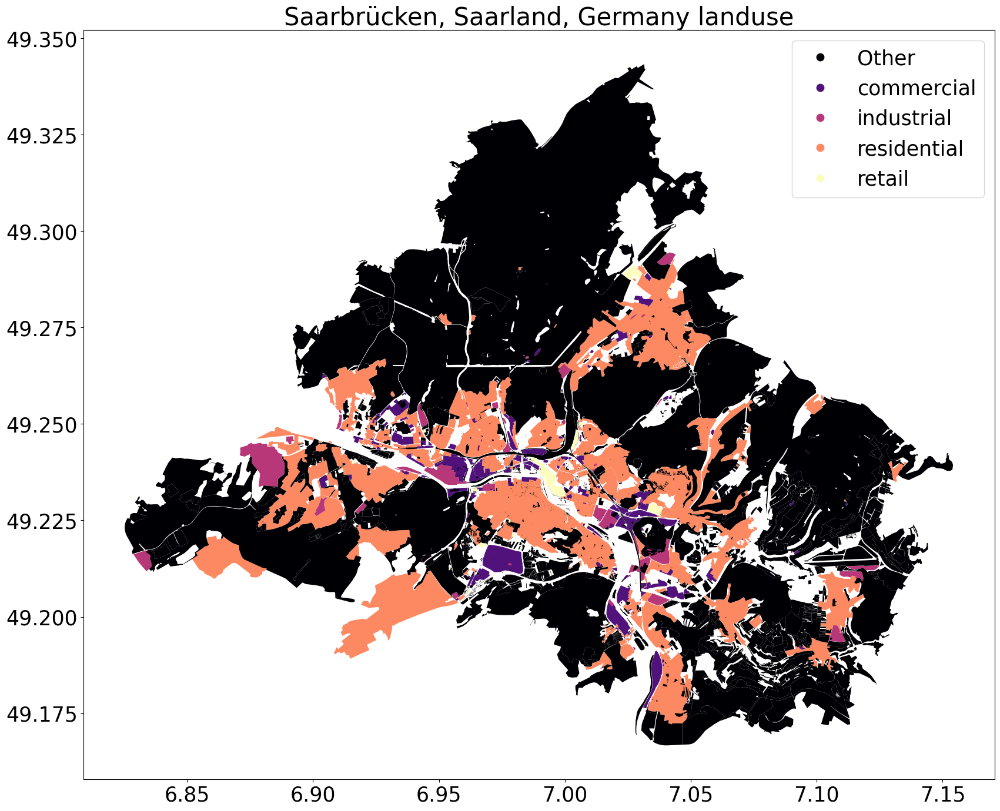

In [59]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [60]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [61]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_24920/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [62]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 808/808 [00:00<00:00, 9293.45it/s]


In [63]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [64]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [65]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          768
commercial      17
residential     11
retail           7
industrial       5
Name: count, dtype: int64

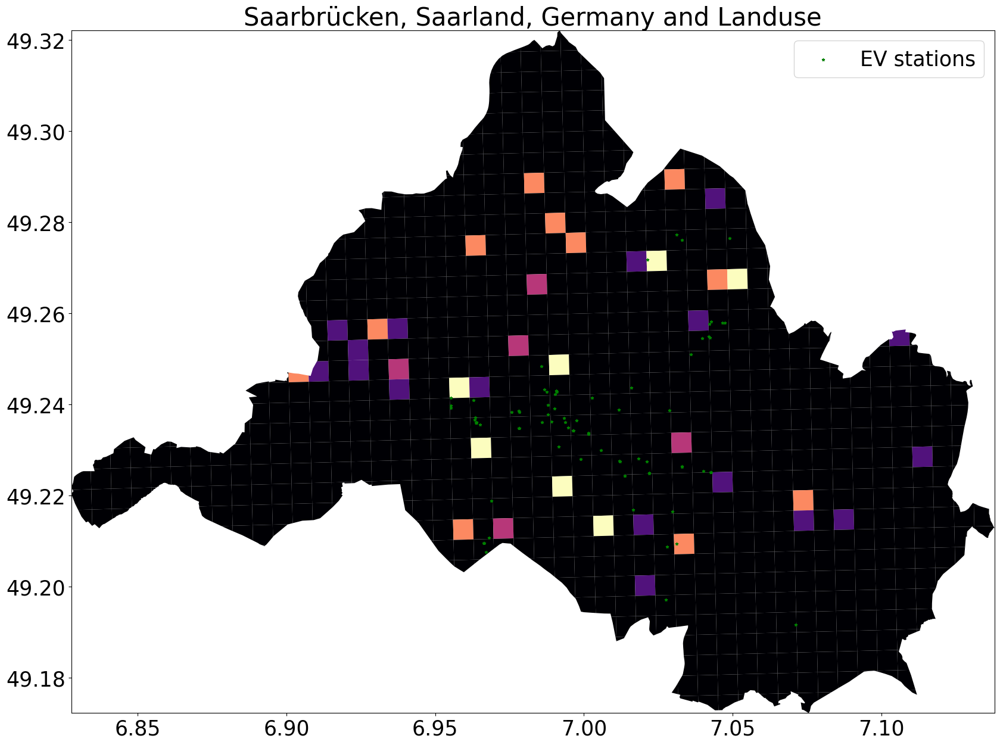

In [66]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

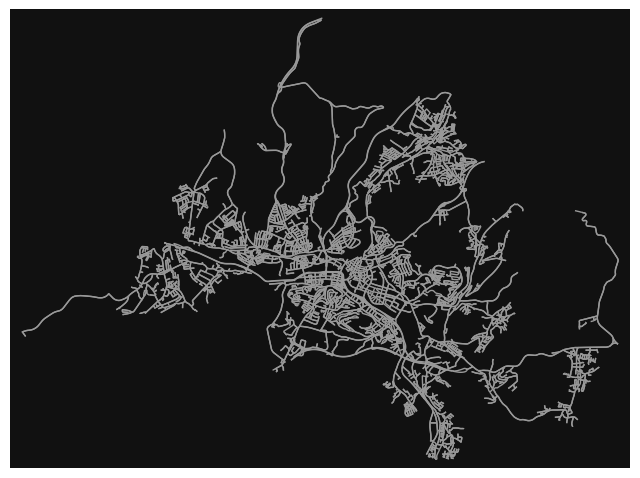

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [67]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [68]:
area,edges = ox.graph_to_gdfs(G)

In [76]:
# poly = city_polyframe_lat_long.loc[400, 'geometry']
# G_1 = ox.graph_from_polygon(poly, network_type='drive')
# ox.plot_graph(G_1)

# #print number of nodes and edges and density
# print('Number of nodes in the graph: ', len(list(G_1.nodes())))
# print('Number of edges in the graph: ', len(list(G_1.edges())))
# print('Density of the graph: ', nx.density(G_1))

In [77]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 808/808 [06:15<00:00,  2.15it/s]


In [78]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [79]:
#relation between EV stations and nodes

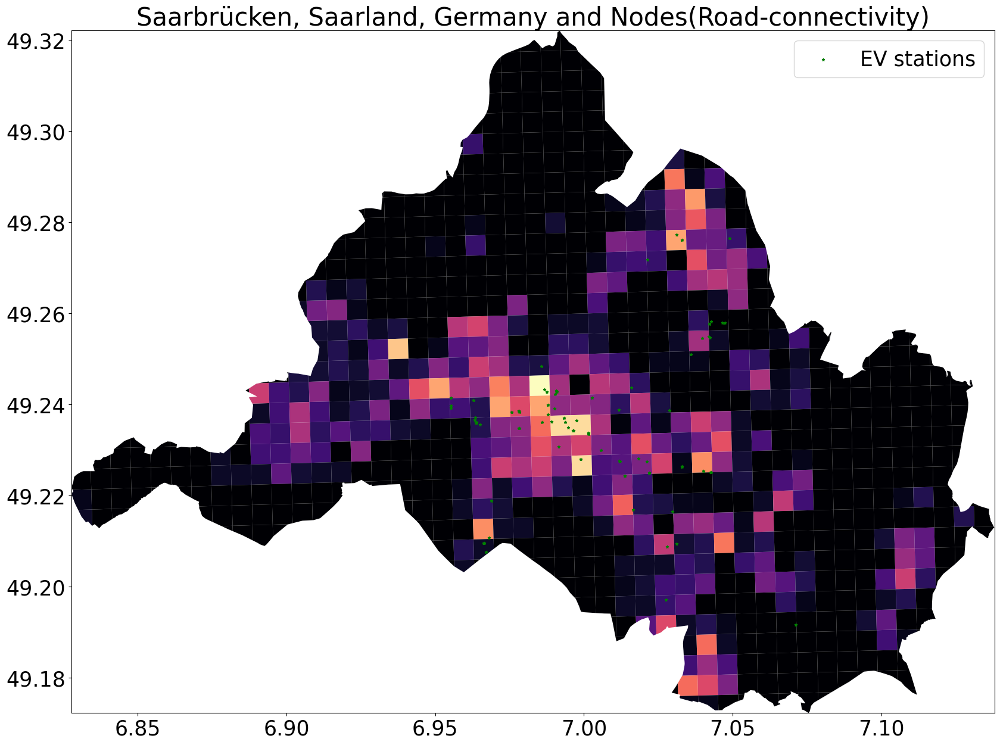

In [80]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

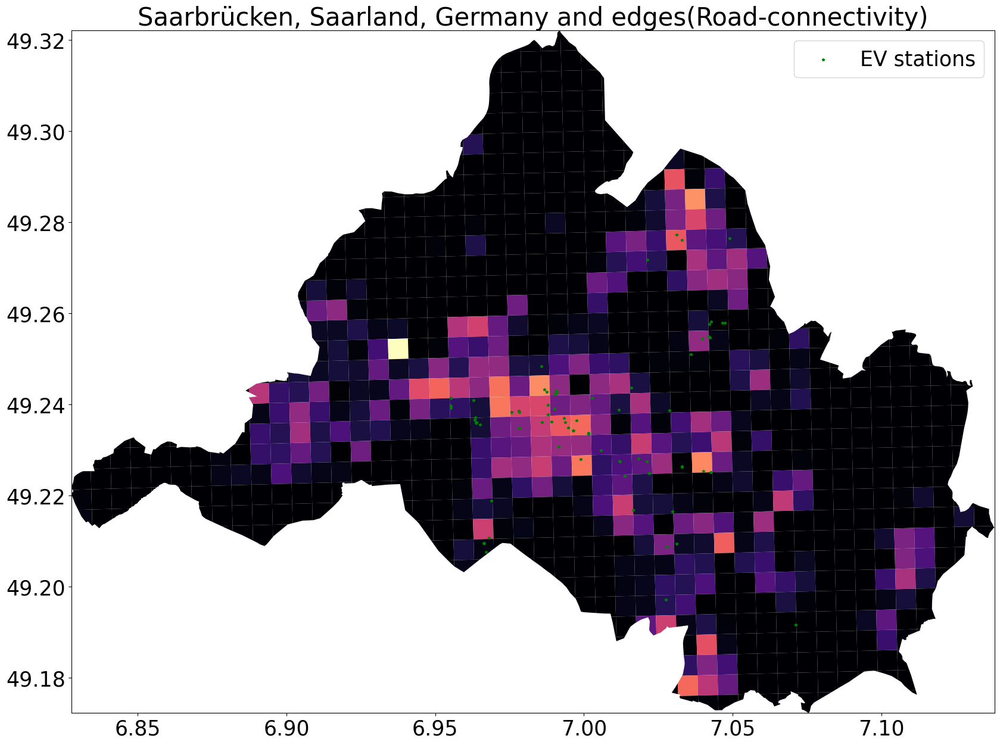

In [81]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

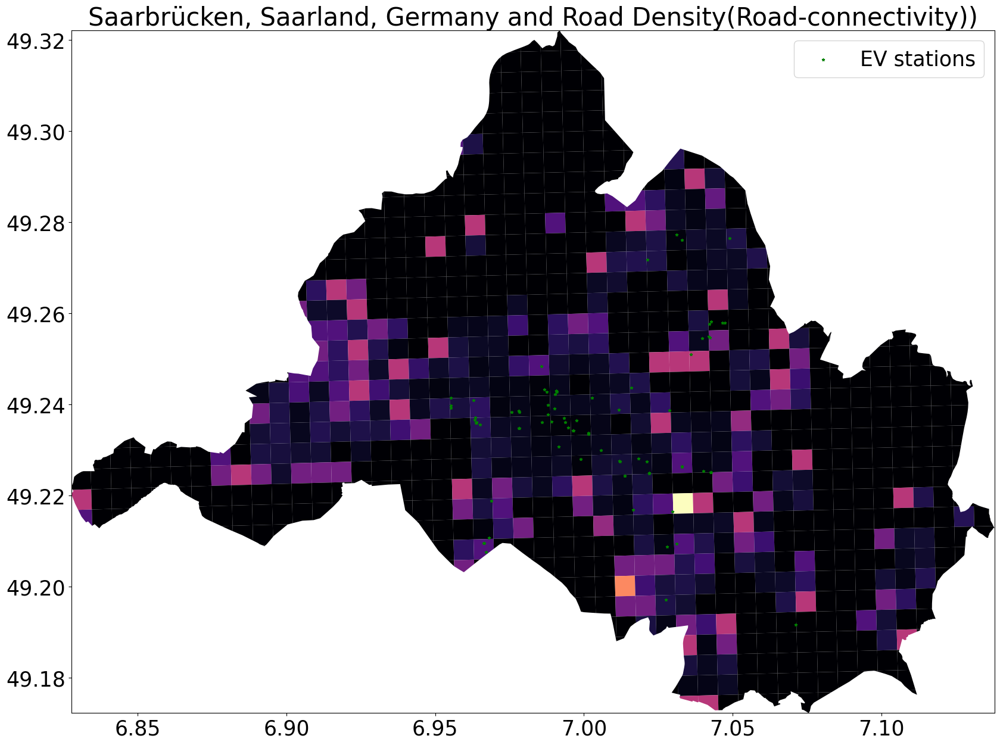

In [82]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [83]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

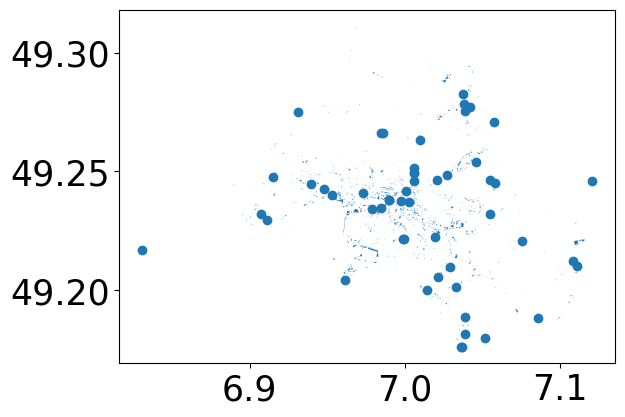

In [84]:
#parking spaces in the city
parking.plot()

In [85]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 808/808 [00:00<00:00, 14927.99it/s]


In [87]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 808/808 [00:01<00:00, 738.00it/s]


In [88]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

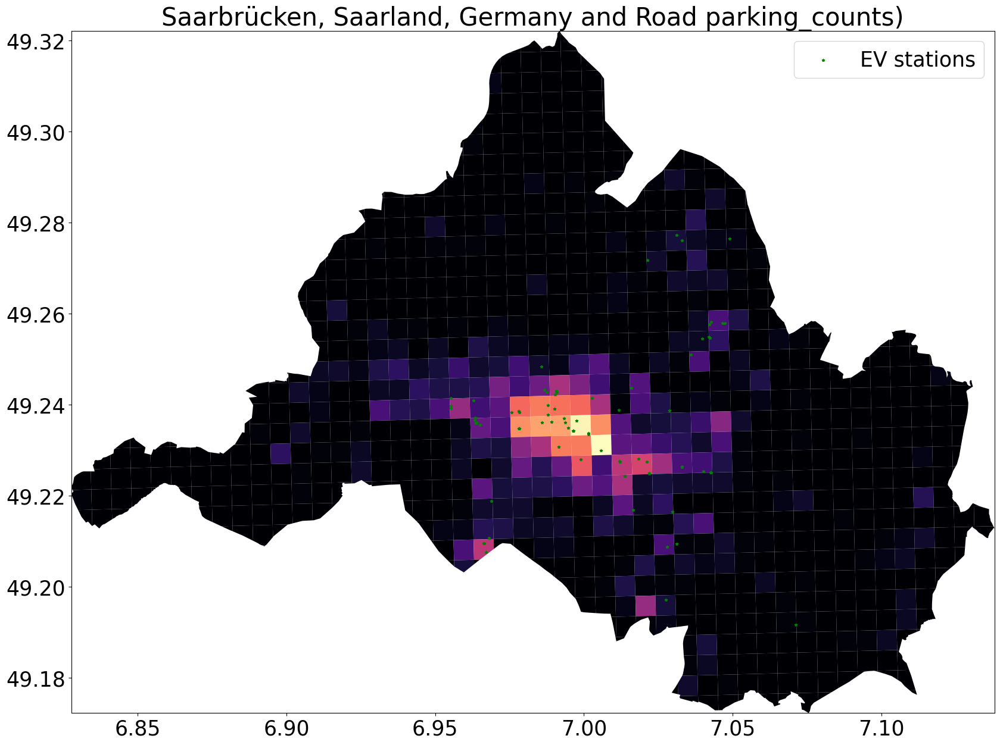

In [89]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [90]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{'surface': 5, 'street_side': 1}                                          2
{'surface': 5}                                                            2
{'surface': 4}                                                            2
{'surface': 1}                                                            2
{'surface': 6, 'street_side': 2}                                          1
{'surface': 9, 'street_side': 2}                                          1
{'surface': 6, 'street_side': 4}                                          1
{'street_side': 7, 'surface': 4}                                          1
{'surface': 3}                                                            1
{'surface': 8, 'street_side': 3}                                          1
{'surface': 24, 'street_side': 22, 'on_kerb': 1}                          1
{'surface': 2}                                                            1
{'surface': 7, 'multi-storey': 1, 'street_side': 1}                       

##### Resturants

In [91]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

<Axes: >

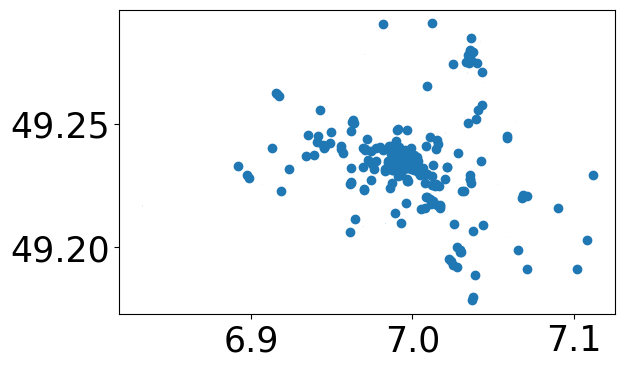

In [92]:
restaurant.plot()

In [93]:
list(restaurant.columns)

['addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'contact:phone',
 'cuisine',
 'level',
 'name',
 'old_name',
 'opening_hours',
 'operator',
 'outdoor_seating',
 'smoking',
 'strapline',
 'toilets',
 'geometry',
 'contact:email',
 'contact:fax',
 'contact:website',
 'diet:vegetarian',
 'indoor_seating',
 'stars',
 'tenant',
 'wheelchair',
 'wikidata',
 'opening_hours:kitchen',
 'wheelchair:description',
 'alt_name',
 'brewery',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'lastcheck',
 'phone',
 'website',
 'diet:vegan',
 'email',
 'delivery',
 'payment:cash',
 'payment:credit_cards',
 'payment:debit_cards',
 'start_date',
 'takeaway',
 'toilets:wheelchair',
 'website:menu',
 'contact:facebook',
 'contact:instagram',
 'diet:halal',
 'organic',
 'short_name',
 'description',
 'fixme',
 'microbrewery',
 'name:etymology:wikidata',
 'opening_hours:covid19',
 'brewery:wikidata',
 'brewery:schwarzbier',
 'brewery:weizen',
 'payment:giroc

In [94]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 808/808 [00:00<00:00, 20656.06it/s]


In [95]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 808/808 [00:00<00:00, 1451.07it/s]


In [96]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

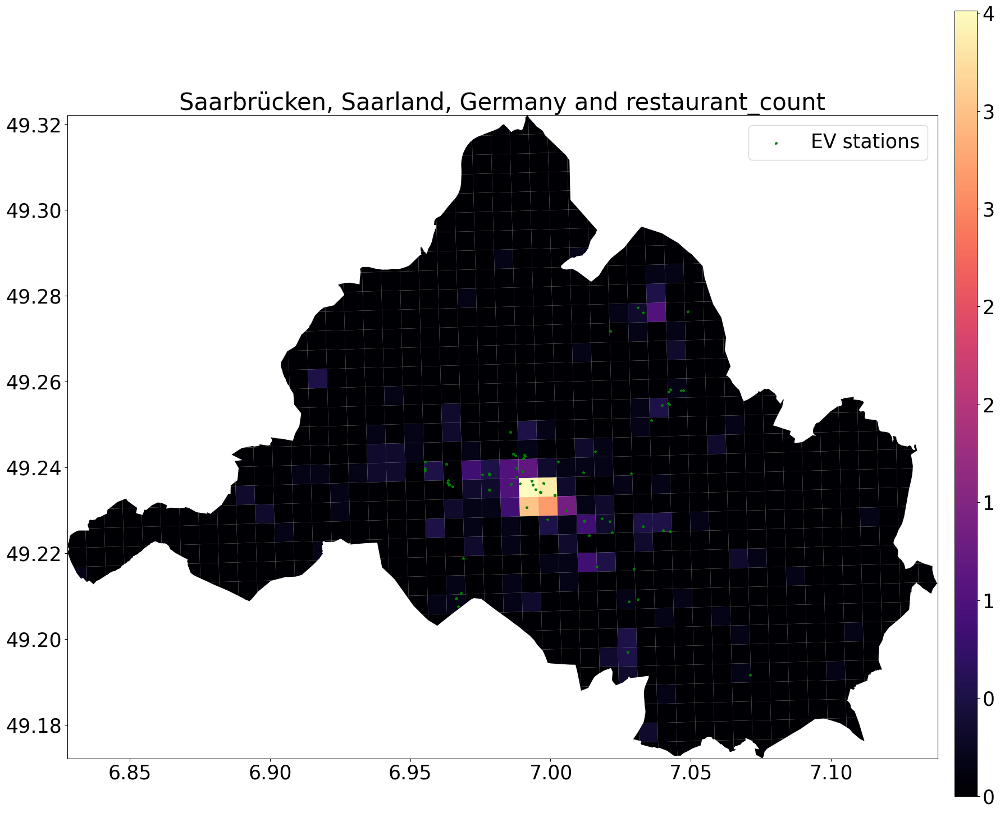

In [97]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [98]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

geometry    addr:city addr:country  \
element_type osmid                                                            
node         3718335100  POINT (7.00753 49.23088)  Saarbrücken           DE   
             4230856864  POINT (7.03985 49.25282)  Saarbrücken          NaN   
             5979651648  POINT (7.03889 49.25306)  Saarbrücken          NaN   
             5986564966  POINT (7.03985 49.25276)  Saarbrücken          NaN   
             6242935587  POINT (7.04115 49.25297)          NaN          NaN   

                        addr:housenumber addr:postcode  \
element_type osmid                                       
node         3718335100              111         66121   
             4230856864             B4 1         66123   
             5979651648             B1 1         66123   
             5986564966             B4 1         66123   
             6242935587              NaN           NaN   

                                         addr:street  amenity  \
element_type osmid                                              
node         3718335100  Großherzog-Friedrich-Straße  library   
             4230856864                       Campus  library   
             5979651648                       Campus  library   
             5986564966                       Campus  library   
             6242935587                          NaN  library   

                                               contact:email    contact:phone  \
element_type osmid                                                              
node         3718335100  info@frauengenderbibliothek-saar.de  +49 681 9388023   
             4230856864                                  NaN              NaN   
             5979651648           romanib@mx.uni-saarland.de              NaN   
             5986564966                                  NaN              NaN   
             6242935587                                  NaN              NaN   

                                                           contact:website  \
element_type osmid                                                           
node         3718335100         http://www.frauengenderbibliothek-saar.de/   
             4230856864  http://bildungswissenschaften.uni-saarland.de/...   
             5979651648  https://www.uni-saarland.de/fachrichtung/roman...   
             5986564966  https://www.uni-saarland.de/fakultaet-hw/wiwis...   
             6242935587  https://www.uni-saarland.de/fakultaet-p/biblio...   

                         ... description:en:covid19 internet_access  \
element_type osmid       ...                                          
node         3718335100  ...                    NaN             NaN   
             4230856864  ...                    NaN             NaN   
             5979651648  ...                    NaN             NaN   
             5986564966  ...                    NaN             NaN   
             6242935587  ...                    NaN             NaN   

                        internet_access:authentication  \
element_type osmid                                       
node         3718335100                            NaN   
             4230856864                            NaN   
             5979651648                            NaN   
             5986564966                            NaN   
             6242935587                            NaN   

                        internet_access:captive_portal internet_access:fee  \
element_type osmid                                                           
node         3718335100                            NaN                 NaN   
             4230856864                            NaN                 NaN   
             5979651648                            NaN                 NaN   
             5986564966                            NaN                 NaN   
             6242935587                            NaN                 NaN   

                        internet_access:ssid toilets:acce

<Axes: >

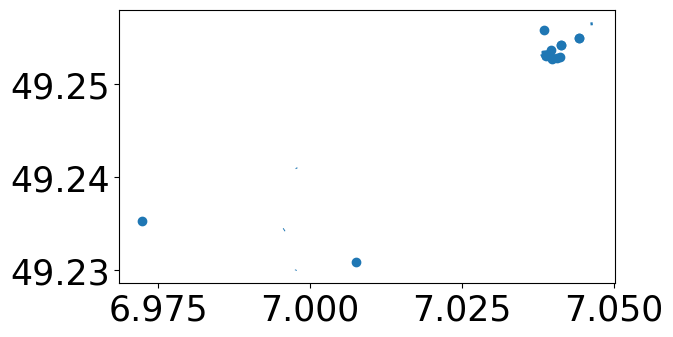

In [99]:
library.plot()

In [100]:
list(library.columns)

['geometry',
 'addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'contact:email',
 'contact:phone',
 'contact:website',
 'level',
 'name',
 'opening_hours',
 'polling_station',
 'polling_station:ref',
 'ref:isil',
 'wheelchair',
 'wikidata',
 'wikipedia',
 'short_name',
 'note:ref:isil',
 'toilets:wheelchair',
 'operator',
 'check_date:opening_hours',
 'nodes',
 'building',
 'building:levels',
 'building:levels:underground',
 'department',
 'description:en',
 'faculty',
 'height',
 'roof:shape',
 'building:part',
 'building:roof',
 'contact:fax',
 'description:payment',
 'opening_hours:covid19',
 'payment:account_cards',
 'capacity:covid19',
 'description:covid19',
 'description:en:covid19',
 'internet_access',
 'internet_access:authentication',
 'internet_access:captive_portal',
 'internet_access:fee',
 'internet_access:ssid',
 'toilets:access',
 'toilets:authentication:membership_card',
 'toilets:centralkey',
 'website']

In [101]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

100%|██████████| 808/808 [00:00<00:00, 1804.62it/s]


##### University

In [102]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

geometry  \
element_type osmid                                                          
way          30965590   POLYGON ((7.03652 49.25502, 7.03760 49.25608, ...   
             67546450   POLYGON ((6.99678 49.23190, 6.99683 49.23188, ...   
             125721900  POLYGON ((6.99792 49.22993, 6.99780 49.22995, ...   
             159246290  POLYGON ((7.03954 49.25061, 7.03955 49.25061, ...   
             169952835  POLYGON ((7.01711 49.24402, 7.01754 49.24429, ...   

                                                 name wheelchair    addr:city  \
element_type osmid                                                              
way          30965590      Universität des Saarlandes    limited          NaN   
             67546450          Alte Kirche St. Johann        NaN  Saarbrücken   
             125721900      Hochschule für Musik Saar        NaN          NaN   
             159246290  Hermann-Neuberger-Sportschule    limited          NaN   
             169952835         HTW - Campus Rotenbühl    limited          NaN   

                       addr:housenumber addr:postcode       addr:street  \
element_type osmid                                                        
way          30965590               NaN           NaN               NaN   
             67546450                29         66111  Ev.-Kirch-Straße   
             125721900                1         66111    Bismarckstraße   
             159246290              NaN           NaN               NaN   
             169952835              NaN           NaN               NaN   

                                    contact:website description     amenity  \
element_type osmid                                                            
way          30965590      https://uni-saarland.de/         NaN  university   
             67546450                           NaN         NaN  university   
             125721900  http://www.hfm.saarland.de/         NaN  university   
             159246290                          NaN         NaN  university   
             169952835                          NaN         NaN  university   

                        ...  \
element_type osmid      ...   
way          30965590   ...   
             67546450   ...   
             125721900  ...   
             159246290  ...   
             169952835  ...   

                                                           description:de  \
element_type osmid                                                          
way          30965590                                                 NaN   
             67546450   Die ehemalige evangelische Kirche ist seit 201...   
             125721900                                                NaN   
             159246290                                                NaN   
             169952835                                                NaN   

                                                   name:fr  \
element_type osmid                                           
way          30965590                                  NaN   
             67546450                                  NaN   
             125721900  Conservatoire supérieur de musique   
             159246290                                 NaN   
             169952835                                 NaN   

                       name:etymology:wikidata toilets:wheelchair  \
element_type osmid                                                  
way          30965590                      NaN                NaN   
             67546450                      NaN                NaN   
             125721900                     NaN                NaN   
             159246290                  Q75199                NaN   
             169952835                     NaN                yes   

                       operator:wikidata operator:type website ways  \
element_type osmid                                                    
way          30965590                NaN           NaN    

<Axes: >

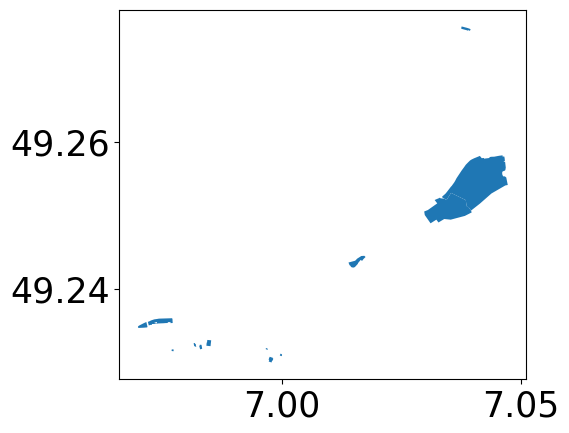

In [103]:
university.plot()

In [104]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 808/808 [00:00<00:00, 1857.43it/s]


##### School

In [105]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

amenity  \
element_type osmid                
node         262213449   school   
             1883604701  school   
             2225222337  school   
             8531657717  school   
             9925671938  school   

                                                                      name  \
element_type osmid                                                           
node         262213449   Katharine-Weißgerber-Schule – Außenstelle Gers...   
             1883604701               Landesfeuerwehrschule des Saarlandes   
             2225222337                                                NaN   
             8531657717                         Abendgymnasium Saarbrücken   
             9925671938                      Ecole Française de Sarrebruck   

                        operator:wikidata                  geometry  \
element_type osmid                                                    
node         262213449              Q6805  POINT (6.92223 49.23140)   
             1883604701               NaN  POINT (6.95693 49.24553)   
             2225222337               NaN  POINT (7.06766 49.20137)   
             8531657717               NaN  POINT (7.00070 49.23449)   
             9925671938               NaN  POINT (7.01618 49.23017)   

                        wheelchair                                  operator  \
element_type osmid                                                             
node         262213449         NaN                                       NaN   
             1883604701        NaN  Ministerium für Inneres, Bauen und Sport   
             2225222337        NaN                                       NaN   
             8531657717        NaN               Regionalverband Saarbrücken   
             9925671938        NaN                                       NaN   

                           addr:city addr:housenumber addr:postcode  \
element_type osmid                                                    
node         262213449           NaN              NaN           NaN   
             1883604701  Saarbrücken              17a         66113   
             2225222337          NaN              NaN           NaN   
             8531657717  Saarbrücken                3         66111   
             9925671938          NaN              NaN           NaN   

                                 addr:street  ... historic image name:en  \
element_type osmid                            ...                          
node         262213449                   NaN  ...      NaN   NaN     NaN   
             1883604701  Weißenburger Straße  ...      NaN   NaN     NaN   
             2225222337                  NaN  ...      NaN   NaN     NaN   
             8531657717        Landwehrplatz  ...      NaN   NaN     NaN   
             9925671938                  NaN  ...      NaN   NaN     NaN   

                        institution:pedagogy contact:facebook school:de ways  \
element_type osmid                                                             
node         262213449                   NaN              NaN       NaN  NaN   
             1883604701                  NaN              NaN       NaN  NaN   
             2225222337                  NaN              NaN       NaN  NaN   
             8531657717                  NaN              NaN       NaN  NaN   
             9925671938                  NaN              NaN       NaN  NaN   

                        building:levels roof:shape type  
element_type osmid                                       
node         262213449              NaN        NaN  NaN  
             1883604701             NaN        NaN  NaN  
             2225222337             NaN        NaN  NaN  
             8531657717             NaN        NaN  NaN  
             9925671938             NaN        NaN  NaN  

[5 rows x 55 columns]

<Axes: >

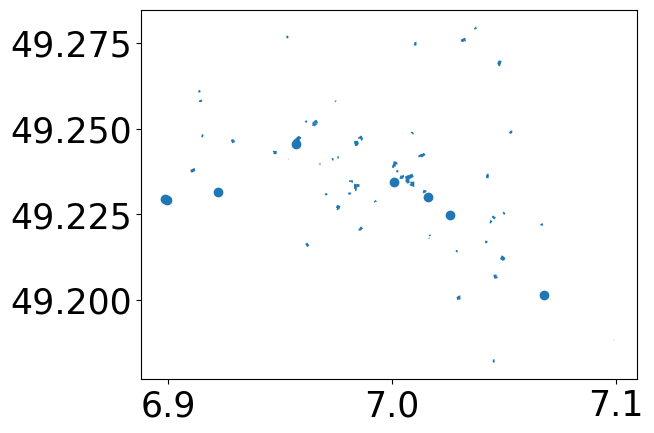

In [106]:
school.plot()

In [107]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 808/808 [00:00<00:00, 1566.83it/s]


##### Leisure = park

In [108]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


barrier wheelchair  \
element_type osmid                         
way          15033190     NaN        NaN   
             24906766     NaN        NaN   
             24942699     NaN        NaN   
             25328311     NaN        NaN   
             25397079     NaN        NaN   

                                                                geometry  \
element_type osmid                                                         
way          15033190  POLYGON ((7.01515 49.24218, 7.01578 49.24167, ...   
             24906766  POLYGON ((6.98578 49.23371, 6.98583 49.23372, ...   
             24942699  POLYGON ((6.98986 49.23847, 6.98977 49.23851, ...   
             25328311  POLYGON ((7.01755 49.22290, 7.01756 49.22292, ...   
             25397079  POLYGON ((7.02423 49.22426, 7.02419 49.22424, ...   

                      access                    name noname tourism  \
element_type osmid                                                    
way          15033190    NaN               Ilseplatz    NaN     NaN   
             24906766    NaN                     NaN    NaN     NaN   
             24942699    NaN  Wolfgang-Staudte-Platz    NaN     NaN   
             25328311    NaN                     NaN    NaN     NaN   
             25397079    NaN            Römerkastell    NaN     NaN   

                      wikimedia_commons note contact:website  ...  \
element_type osmid                                            ...   
way          15033190               NaN  NaN             NaN  ...   
             24906766               NaN  NaN             NaN  ...   
             24942699               NaN  NaN             NaN  ...   
             25328311               NaN  NaN             NaN  ...   
             25397079               NaN  NaN             NaN  ...   

                      abandoned:landuse contact:phone operator:wikidata  zoo  \
element_type osmid                                                             
way          15033190               NaN           NaN               NaN  NaN   
             24906766               NaN           NaN               NaN  NaN   
             24942699               NaN           NaN               NaN  NaN   
             25328311               NaN           NaN               NaN  NaN   
             25397079               NaN           NaN               NaN  NaN   

                      website disused:landuse landuse:1851-1917 source ways  \
element_type osmid                                                            
way          15033190     NaN             NaN               NaN    NaN  NaN   
             24906766     NaN             NaN               NaN    NaN  NaN   
             24942699     NaN             NaN               NaN    NaN  NaN   
             25328311     NaN             NaN               NaN    NaN  NaN   
             25397079     NaN             NaN               NaN    NaN  NaN   

                      type  
element_type osmid          
way          15033190  NaN  
             24906766  NaN  
             24942699  NaN  
             25328311  NaN  
             25397079  NaN  

[5 rows x 41 columns]

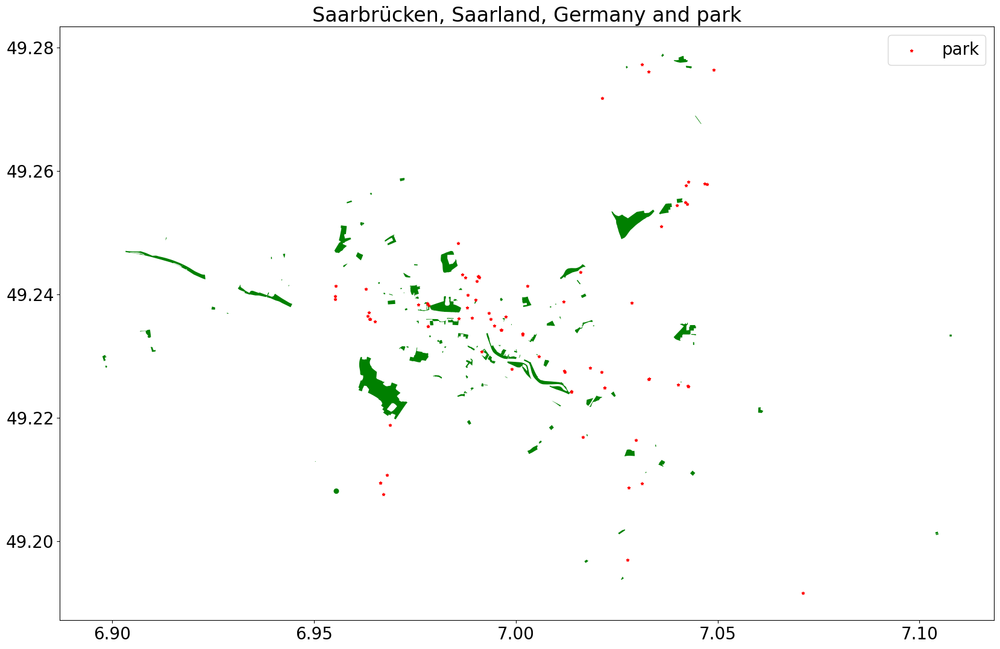

In [109]:
#plot the park data 

plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [110]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 808/808 [00:00<00:00, 1836.26it/s]


##### Leisure = Cinema

In [111]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

addr:city addr:country addr:housenumber  \
element_type osmid                                                   
node         279000168   Saarbrücken           DE              5-7   
             410760602   Saarbrücken           DE               19   
             833406971           NaN          NaN                8   
             3614584254  Saarbrücken          NaN                8   
             3614680793          NaN          NaN                8   

                             addr:street amenity      contact:email  \
element_type osmid                                                    
node         279000168      Futterstraße  cinema  info@camerazwo.de   
             410760602   Nauwieserstraße  cinema                NaN   
             833406971    Mainzer Straße  cinema                NaN   
             3614584254   Mainzer Straße  cinema                NaN   
             3614680793   Mainzer Straße  cinema                NaN   

                         contact:phone           contact:website  \
element_type osmid                                                 
node         279000168   +49 681 32527  http://www.camerazwo.de/   
             410760602             NaN                       NaN   
             833406971             NaN                       NaN   
             3614584254            NaN                       NaN   
             3614680793            NaN                       NaN   

                                                   name          old_name  \
element_type osmid                                                          
node         279000168   camera zwo - das arthouse kino  Scala Filmpalast   
             410760602                 Kino achteinhalb               NaN   
             833406971                         Filmhaus               NaN   
             3614584254          Schauplatz im Filmhaus               NaN   
             3614680793             Galerie im Filmhaus               NaN   

                         ... toilets:wheelchair nodes brand brand:wikidata  \
element_type osmid       ...                                                 
node         279000168   ...                NaN   NaN   NaN            NaN   
             410760602   ...                NaN   NaN   NaN            NaN   
             833406971   ...                 no   NaN   NaN            NaN   
             3614584254  ...                 no   NaN   NaN            NaN   
             3614680793  ...                 no   NaN   NaN            NaN   

                        brand:wikipedia building alt_name amenity:start_date  \
element_type osmid                                                             
node         279000168              NaN      NaN      NaN                NaN   
             410760602              NaN      NaN      NaN                NaN   
             833406971              NaN      NaN      NaN                NaN   
             3614584254             NaN      NaN      NaN                NaN   
             3614680793             NaN      NaN      NaN                NaN   

                        building:levels roof:shape  
element_type osmid                                  
node         279000168              NaN        NaN  
             410760602              NaN        NaN  
             833406971              NaN        NaN  
             3614584254             NaN        NaN  
             3614680793             NaN        NaN  

[5 rows x 33 columns]

<Axes: >

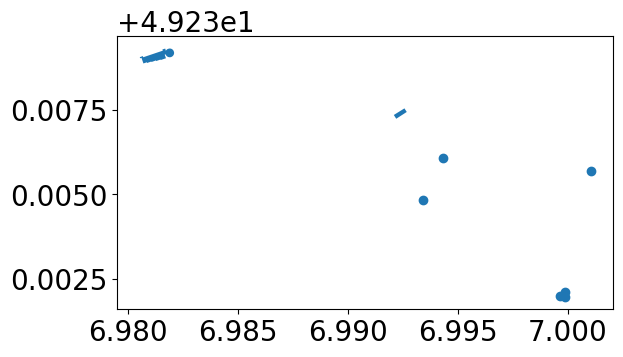

In [112]:
cinema.plot()

In [113]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

100%|██████████| 808/808 [00:00<00:00, 1773.20it/s]


##### Townhall

In [114]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

,,wheelchair,geometry,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,operator,historic,name,...,building:levels,name:fr,opening_hours:signed,roof:shape,start_date,type,website,wikidata,wikimedia_commons,wikipedia
element_type,osmid,,,,,,,,,,,,,,,,,,,,,
way,129149342,NaN,"POLYGON ((7.03573 49.27845, 7.03587 49.27830, ...",NaN,NaN,NaN,NaN,townhall,NaN,NaN,Rathaus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
relation,8271085,limited,"POLYGON ((6.99622 49.23491, 6.99627 49.23494, ...",Saarbrücken,1,66111,Rathausplatz,townhall,Landeshauptstadt Saarbrücken,yes,Rathaus St. Johann,...,9,Hôtel de ville St-Jean,no,many,1897..1900,multipolygon,https://www.saarbruecken.de/de/rathaus/rathaus...,Q2132615,Category:Rathaus Saarbrücken,de:Rathaus St. Johann


<Axes: >

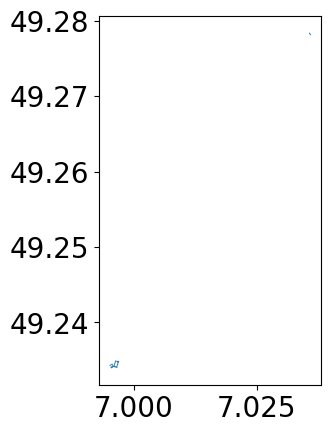

In [115]:
townhall.plot()

In [116]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 808/808 [00:00<00:00, 1807.52it/s]


##### Community_centre

In [117]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

addr:country addr:housenumber addr:postcode  \
element_type osmid                                                    
node         335857524            DE              6-8         66111   
             768004612           NaN              NaN           NaN   
             931697666           NaN              NaN           NaN   
             1037346649          NaN              NaN           NaN   
             1375695918          NaN              NaN           NaN   

                           addr:street     alt_name           amenity  \
element_type osmid                                                      
node         335857524   Försterstraße  Förster-Juz  community_centre   
             768004612             NaN          NaN  community_centre   
             931697666             NaN          NaN  community_centre   
             1037346649            NaN          NaN  community_centre   
             1375695918            NaN          NaN  community_centre   

                        community_centre community_centre:for  \
element_type osmid                                              
node         335857524      youth_centre             juvenile   
             768004612         club_home                  NaN   
             931697666               NaN                  NaN   
             1037346649              NaN                  NaN   
             1375695918     meeting_room                  NaN   

                                        contact:email  \
element_type osmid                                      
node         335857524   juz.foersterstrasse@rvsbr.de   
             768004612                            NaN   
             931697666                            NaN   
             1037346649                           NaN   
             1375695918                           NaN   

                                             contact:facebook  ...  \
element_type osmid                                             ...   
node         335857524   https://www.facebook.com/juzfoerster  ...   
             768004612                                    NaN  ...   
             931697666                                    NaN  ...   
             1037346649                                   NaN  ...   
             1375695918   https://www.facebook.com/weltraumsb  ...   

                        internet_access:operator:wikidata leisure nodes  \
element_type osmid                                                        
node         335857524                                NaN     NaN   NaN   
             768004612                                NaN     NaN   NaN   
             931697666                                NaN     NaN   NaN   
             1037346649                               NaN     NaN   NaN   
             1375695918                               NaN     NaN   NaN   

                        building sport building:levels building:use  \
element_type osmid                                                    
node         335857524       NaN   NaN             NaN          NaN   
             768004612       NaN   NaN             NaN          NaN   
             931697666       NaN   NaN             NaN          NaN   
             1037346649      NaN   NaN             NaN          NaN   
             1375695918      NaN   NaN             NaN          NaN   

                        building:colour roof:orientation roof:shape  
element_type osmid                                                   
node         335857524              NaN              NaN        NaN  
             768004612              NaN              NaN        NaN  
             931697666              NaN              NaN        NaN  
             1037346649             NaN              NaN        NaN  
             1375695918             NaN              NaN        NaN  

[5 rows x 68 columns]

In [118]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 808/808 [00:00<00:00, 1780.75it/s]


In [119]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [120]:
government = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "government"},
)

government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
government.head()

wheelchair  \
element_type osmid                 
way          92005243        NaN   
             92197547        NaN   
             92197548        NaN   
             92197549        NaN   
             92197555        NaN   

                                                                geometry  \
element_type osmid                                                         
way          92005243  POLYGON ((7.01691 49.22860, 7.01680 49.22843, ...   
             92197547  POLYGON ((7.01610 49.22906, 7.01655 49.22897, ...   
             92197548  POLYGON ((7.01773 49.22850, 7.01753 49.22856, ...   
             92197549  POLYGON ((7.01796 49.22979, 7.01802 49.22978, ...   
             92197555  POLYGON ((7.01726 49.22933, 7.01767 49.22925, ...   

                                                                   nodes  \
element_type osmid                                                         
way          92005243  [1068844877, 1068844862, 8495020169, 849502020...   
             92197547  [2462710841, 9929361583, 2198046550, 760576109...   
             92197548  [1070385658, 1070385683, 2198046587, 219804684...   
             92197549  [1070385382, 7667665102, 1070385678, 107038554...   
             92197555  [1070385704, 1147904061, 1070385579, 760576113...   

                         addr:city addr:housenumber addr:postcode  \
element_type osmid                                                  
way          92005243  Saarbrücken              136         66121   
             92197547          NaN              NaN           NaN   
             92197548  Saarbrücken              118         66121   
             92197549  Saarbrücken              116         66121   
             92197555          NaN              NaN           NaN   

                          addr:street    building building:levels roof:shape  \
element_type osmid                                                             
way          92005243  Mainzer Straße  government             NaN        NaN   
             92197547             NaN  government               5       flat   
             92197548   Halbergstraße  government             NaN     hipped   
             92197549   Halbergstraße  government             NaN     hipped   
             92197555             NaN  government             NaN       flat   

                      building:use wikimedia_commons architect start_date  \
element_type osmid                                                          
way          92005243          NaN               NaN       NaN        NaN   
             92197547          NaN               NaN       NaN        NaN   
             92197548          NaN               NaN       NaN        NaN   
             92197549  residential               NaN       NaN        NaN   
             92197555          NaN               NaN       NaN        NaN   

                      ways addr:country addr:housename name type  
element_type osmid                                                
way          92005243  NaN          NaN            NaN  NaN  NaN  
             92197547  NaN          NaN            NaN  NaN  NaN  
             92197548  NaN          NaN            NaN  NaN  NaN  
             92197549  NaN          NaN            NaN  NaN  NaN  
             92197555  NaN          NaN            NaN  NaN  NaN

<Axes: >

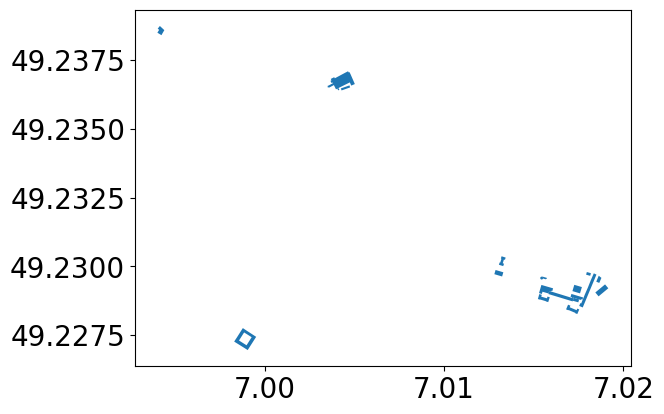

In [121]:
government.plot()

In [122]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 808/808 [00:00<00:00, 1880.82it/s]


##### Building=civic 

In [123]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

geometry  \
element_type osmid                                                          
way          67522397   POLYGON ((6.98761 49.23734, 6.98760 49.23731, ...   
             94426454   POLYGON ((7.01093 49.24458, 7.01091 49.24459, ...   
             116730597  POLYGON ((7.03824 49.28189, 7.03831 49.28205, ...   
             220022582  POLYGON ((7.00609 49.24556, 7.00612 49.24557, ...   
             737404399  POLYGON ((6.94052 49.23986, 6.94064 49.23981, ...   

                                       name  \
element_type osmid                            
way          67522397         Congresshalle   
             94426454   Ev. Gemeindezentrum   
             116730597                  NaN   
             220022582                  NaN   
             737404399        Haus der DLRG   

                                                                    nodes  \
element_type osmid                                                          
way          67522397   [1404338678, 1404343134, 1404343149, 140433868...   
             94426454   [1096922939, 1096921373, 1096919926, 109692335...   
             116730597  [1315255011, 1315255021, 1315255016, 131525502...   
             220022582  [1098412455, 1501227368, 1098411537, 109841465...   
             737404399  [1014913975, 7888198995, 7888198994, 107679548...   

                          addr:city addr:country addr:housenumber  \
element_type osmid                                                  
way          67522397   Saarbrücken           DE               12   
             94426454   Saarbrücken          NaN                4   
             116730597  Saarbrücken          NaN                1   
             220022582  Saarbrücken          NaN               59   
             737404399  Saarbrücken           DE               12   

                       addr:postcode           addr:street building  \
element_type osmid                                                    
way          67522397          66111           Hafenstraße    civic   
             94426454          66123          Liebigstraße    civic   
             116730597         66125       Fischbachstraße    civic   
             220022582         66123  Dudweiler Landstraße    civic   
             737404399         66115     Mettlacher Straße    civic   

                       building:levels  ...  \
element_type osmid                      ...   
way          67522397                3  ...   
             94426454                2  ...   
             116730597             NaN  ...   
             220022582               2  ...   
             737404399             NaN  ...   

                                                       website   wikidata  \
element_type osmid                                                          
way          67522397   https://www.ccsaar.de/congresscentrum/  Q15055204   
             94426454                                      NaN        NaN   
             116730597                                     NaN        NaN   
             220022582                                     NaN        NaN   
             737404399                                     NaN        NaN   

                                         wikimedia_commons         wikipedia  \
element_type osmid                                                             
way          67522397   Category:Congresshalle Saarbrücken  de:Congresshalle   
             94426454                                  NaN               NaN   
             116730597                                 NaN               NaN   
             220022582                                 NaN               NaN   
             737404399                                 NaN               NaN   

                       roof:levels roof:shape                 alt_name  \
element_type osmid                                                       
way          67522397          NaN        NaN                      NaN   
             9442645

<Axes: >

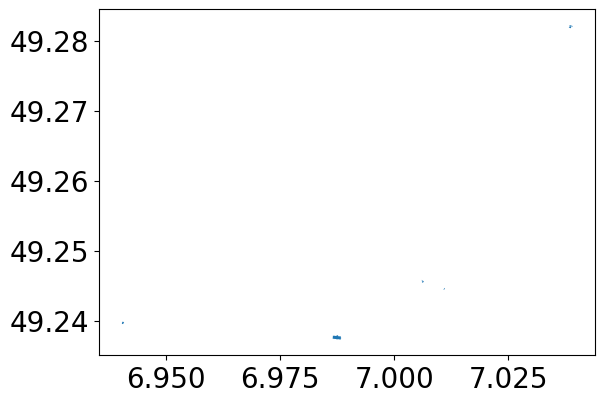

In [124]:
civic.plot()

In [125]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 808/808 [00:00<00:00, 1836.33it/s]


##### building=commercial

In [126]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


wheelchair wheelchair:description  \
element_type osmid                                        
way          69221473        yes                    NaN   
             69549698        NaN                    NaN   
             79034895        NaN                    NaN   
             87261895        yes                    NaN   
             87288191        NaN                    NaN   

                                                                geometry  \
element_type osmid                                                         
way          69221473  POLYGON ((6.96302 49.24074, 6.96328 49.24070, ...   
             69549698  POLYGON ((6.95693 49.23741, 6.95719 49.23739, ...   
             79034895  POLYGON ((6.98374 49.23994, 6.98406 49.24001, ...   
             87261895  POLYGON ((6.96532 49.23339, 6.96537 49.23339, ...   
             87288191  POLYGON ((6.92532 49.24474, 6.92504 49.24480, ...   

                         addr:city addr:housenumber addr:postcode  \
element_type osmid                                                  
way          69221473  Saarbrücken                1         66115   
             69549698          NaN              NaN           NaN   
             79034895          NaN               49           NaN   
             87261895  Saarbrücken               95         66117   
             87288191          NaN              NaN           NaN   

                          addr:street amenity surveillance surveillance:type  \
element_type osmid                                                             
way          69221473          Gasweg     NaN          NaN               NaN   
             69549698             NaN     NaN          NaN               NaN   
             79034895             NaN     NaN          NaN               NaN   
             87261895  Saaruferstraße     NaN          NaN               NaN   
             87288191             NaN     NaN          NaN               NaN   

                       ... payment:cryptocurrencies payment:mastercard  \
element_type osmid     ...                                               
way          69221473  ...                      NaN                NaN   
             69549698  ...                      NaN                NaN   
             79034895  ...                      NaN                NaN   
             87261895  ...                      NaN                NaN   
             87288191  ...                      NaN                NaN   

                      payment:paypal payment:visa brand:wikipedia  \
element_type osmid                                                  
way          69221473            NaN          NaN             NaN   
             69549698            NaN          NaN             NaN   
             79034895            NaN          NaN             NaN   
             87261895            NaN          NaN             NaN   
             87288191            NaN          NaN             NaN   

                      building:material indoor_seating ways type  \
element_type osmid                                                 
way          69221473               NaN            NaN  NaN  NaN   
             69549698               NaN            NaN  NaN  NaN   
             79034895               NaN            NaN  NaN  NaN   
             87261895               NaN            NaN  NaN  NaN   
             87288191               NaN            NaN  NaN  NaN   

                      addr:housename  
element_type osmid                    
way          69221473            NaN  
             69549698            NaN  
             79034895            NaN  
             87261895            NaN  
             87288191            NaN  

[5 rows x 86 columns]

<Axes: >

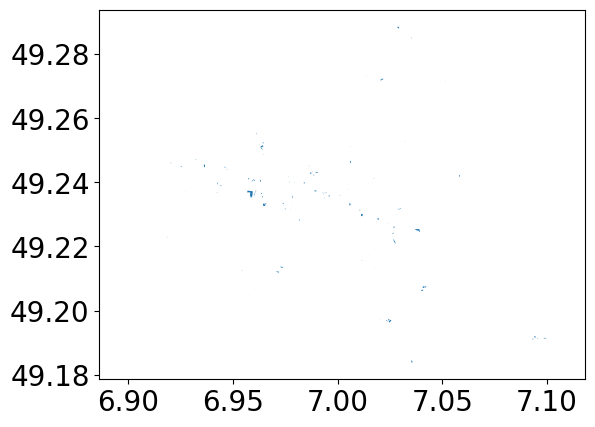

In [127]:
commercial.plot()

In [128]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 808/808 [00:00<00:00, 1739.87it/s]


##### building = Retail stores

In [129]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

surveillance surveillance:type  \
element_type osmid                                     
way          25213116          NaN               NaN   
             30409131          NaN               NaN   
             31682223       indoor               NaN   
             34853979          NaN               NaN   
             35573669          NaN               NaN   

                                                                geometry  \
element_type osmid                                                         
way          25213116  POLYGON ((7.04145 49.28432, 7.04109 49.28443, ...   
             30409131  POLYGON ((7.04096 49.25583, 7.04101 49.25557, ...   
             31682223  POLYGON ((6.98951 49.23945, 6.98946 49.23940, ...   
             34853979  POLYGON ((6.97825 49.22516, 6.97823 49.22513, ...   
             35573669  POLYGON ((7.02538 49.28975, 7.02685 49.29051, ...   

                      wheelchair surveillance:zone level  \
element_type osmid                                         
way          25213116        yes               NaN   NaN   
             30409131        NaN               NaN   NaN   
             31682223        yes               NaN   NaN   
             34853979        yes               NaN   NaN   
             35573669        yes               NaN   NaN   

                      wheelchair:description layer barrier amenity  ...  \
element_type osmid                                                  ...   
way          25213116                    NaN   NaN     NaN     NaN  ...   
             30409131                    NaN   NaN     NaN     NaN  ...   
             31682223                    NaN   NaN     NaN     NaN  ...   
             34853979                    NaN   NaN     NaN     NaN  ...   
             35573669                    NaN   NaN     NaN     NaN  ...   

                      post_office:brand post_office:brand:wikidata  \
element_type osmid                                                   
way          25213116               NaN                        NaN   
             30409131               NaN                        NaN   
             31682223               NaN                        NaN   
             34853979               NaN                        NaN   
             35573669               NaN                        NaN   

                      building:colour office operator:wikidata noaddress  \
element_type osmid                                                         
way          25213116             NaN    NaN               NaN       NaN   
             30409131             NaN    NaN               NaN       NaN   
             31682223             NaN    NaN               NaN       NaN   
             34853979             NaN    NaN               NaN       NaN   
             35573669             NaN    NaN               NaN       NaN   

                      fair_trade tobacco opening_hours:signed fence_type  
element_type osmid                                                        
way          25213116        NaN     NaN                  NaN        NaN  
             30409131        NaN     NaN                  NaN        NaN  
             31682223        NaN     NaN                  NaN        NaN  
             34853979        NaN     NaN                  NaN        NaN  
             35573669        NaN     NaN                  NaN        NaN  

[5 rows x 86 columns]

<Axes: >

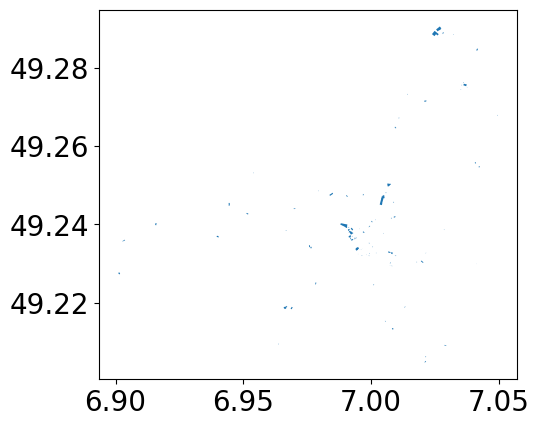

In [130]:
retail.plot()

In [131]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 808/808 [00:00<00:00, 23059.43it/s]


100%|██████████| 808/808 [00:00<00:00, 1660.33it/s]


##### amenity=place_of_worship

In [132]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

addr:city addr:housenumber addr:postcode  \
element_type osmid                                                    
node         275917220   Saarbrücken               15         66133   
             1024646350          NaN              NaN           NaN   
             1058856502          NaN              NaN           NaN   
             3192161724  Saarbrücken            14-16         66121   
             4037815533          NaN              NaN           NaN   

                         addr:street           amenity  \
element_type osmid                                       
node         275917220      Kirchweg  place_of_worship   
             1024646350          NaN  place_of_worship   
             1058856502          NaN  place_of_worship   
             3192161724  Arndtstraße  place_of_worship   
             4037815533          NaN  place_of_worship   

                                                                     name  \
element_type osmid                                                          
node         275917220                                         St. Ursula   
             1024646350                       Evangelische Kirche Scheidt   
             1058856502                                Edith-Stein-Kirche   
             3192161724  Bosnisches Islamisches Kulturzentrum Saarbrücken   
             4037815533                                Krankenhauskapelle   

                          religion wheelchair   wikidata  \
element_type osmid                                         
node         275917220   christian         no  Q15848717   
             1024646350  christian        NaN   Q1380896   
             1058856502  christian    limited        NaN   
             3192161724     muslim        NaN        NaN   
             4037815533  christian        NaN        NaN   

                                                         wikimedia_commons  \
element_type osmid                                                           
node         275917220                       Category:St. Ursula (Scheidt)   
             1024646350  Category:Evangelische Kirche Scheidt (Saarbrüc...   
             1058856502                                                NaN   
             3192161724                                                NaN   
             4037815533                                                NaN   

                         ... building:part addr:neighbourhood capacity  \
element_type osmid       ...                                             
node         275917220   ...           NaN                NaN      NaN   
             1024646350  ...           NaN                NaN      NaN   
             1058856502  ...           NaN                NaN      NaN   
             3192161724  ...           NaN                NaN      NaN   
             4037815533  ...           NaN                NaN      NaN   

                        name:de landuse contact:instagram contact:twitter  \
element_type osmid                                                          
node         275917220      NaN     NaN               NaN             NaN   
             1024646350     NaN     NaN               NaN             NaN   
             1058856502     NaN     NaN               NaN             NaN   
             3192161724     NaN     NaN               NaN             NaN   
             4037815533     NaN     NaN               NaN             NaN   

                        contact:youtube ways type  
element_type osmid                                 
node         275917220              NaN  NaN  NaN  
             1024646350             NaN  NaN  NaN  
             1058856502             NaN  NaN  NaN  
             3192161724             NaN  NaN  NaN  
             4037815533             NaN  NaN  NaN  

[5 rows x 83 columns]

<Axes: >

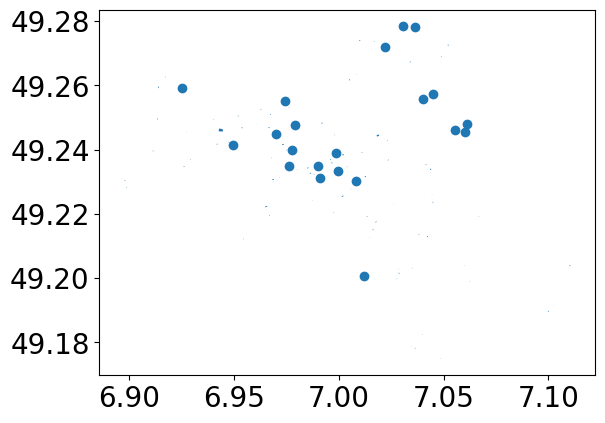

In [133]:
place_of_worship.plot()

In [134]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 808/808 [00:00<00:00, 1708.60it/s]


#### Detailed CSV SAVE

In [135]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")